**Python libraries**
---

In [ ]:
!pip install anchor-exp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 427.3/427.3 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for anchor-exp: filename=anchor_exp-0.0.2.0-py3-none-any.whl size=433498 sha256=d74efbefa9a86b7c3981753c17822daed95db09d958c6cf9594e24c14f735343
  Stored in directory: /root/.cache/pip/wheels/e9/53/45/7e4602020c5e5069ccef79f1389adb8efc4ca3c4d9891388bb
Successfully built anchor-exp


In [ ]:
!pip install torch transformers spacy && python -m spacy download en_core_web_lg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 1.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
!pip install torch transformers spacy && python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 30.3 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
import warnings
warnings.filterwarnings('ignore')
%config Completer.use_jedi = False # if autocompletion doesnot work in kaggle notebook | hit tab

In [ ]:
import numpy as np
import pandas as pd
#import torch
#import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import transformers
from transformers import AutoModel, BertTokenizerFast
#device = torch.device("cuda")

In [ ]:
! pip install eli5==0.13.0
! pip install jinja2==3.0.0

In [ ]:
import scipy
import numpy as np
def monkeypath_itemfreq(sampler_indices):
   return zip(*np.unique(sampler_indices, return_counts=True))

scipy.stats.itemfreq=monkeypath_itemfreq


**Load Data**
---



In [1]:
!pip install transformers

In [2]:
from google.colab import drive
import pandas as pd
import torch
import torch.nn as nn
from transformers import BartModel, BartTokenizer
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
import numpy as np

df_train=pd.read_csv("covid_kd_val.csv",usecols=["data","label"])
#df_train = df_train.sample(n=5000, random_state=42)
# Define the ratio
from sklearn.model_selection import train_test_split

# Assuming df is your DataFrame
# Splitting the DataFrame into training and testing sets
df_train, df_val = train_test_split(df_train, test_size=0.40)  # Adjust test_size as needed

# Print the DataFrames
print("Training DataFrame:")
print(df_train.shape)

print("\nTesting DataFrame:")
print(df_val.shape)


Training DataFrame:
(10521, 2)

Testing DataFrame:
(7014, 2)


In [3]:
df_test=pd.read_csv("covid_kd_test.csv",usecols=["data","label"])
#df_test = df_test.sample(n=2000, random_state=42)
print(df_val.shape)

(7014, 2)


In [4]:
df_train['label'].value_counts()

label
1    5302
0    5219
Name: count, dtype: int64

In [5]:
print(df_train.shape)
print(df_test.shape)
print(df_val.shape)

(10521, 2)
(6820, 2)
(7014, 2)


In [6]:
import pandas as pd
import torch
import torch.nn as nn
from transformers import BartModel, BartTokenizer
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from sklearn.model_selection import train_test_split
import numpy as np


In [7]:
# Extracting text and labels
train_text, train_labels = df_train["data"], df_train["label"]
val_text, val_labels = df_val["data"], df_val["label"]
test_text, test_labels = df_test["data"], df_test["label"]

In [8]:
train_text

3861        anti covid restriction protest aranda de duero
5303     special report highlights potential therapeuti...
2213     video empty covid wing hospital ludwigsburg cl...
17002    tokyo olympic organizing committee ceo rumors ...
2101     help another country need though give american...
                               ...                        
885      president trump suggests testing disinfectant ...
4766     bill melinda gates foundation amp others predi...
14699                          long virus survive surfaces
5241                                stomach symptoms covid
37       zuckerberg done much anyone earth kill profess...
Name: data, Length: 10521, dtype: object

In [9]:
print(train_text.isnull().sum())

0


In [10]:
train_text.dropna()

3861        anti covid restriction protest aranda de duero
5303     special report highlights potential therapeuti...
2213     video empty covid wing hospital ludwigsburg cl...
17002    tokyo olympic organizing committee ceo rumors ...
2101     help another country need though give american...
                               ...                        
885      president trump suggests testing disinfectant ...
4766     bill melinda gates foundation amp others predi...
14699                          long virus survive surfaces
5241                                stomach symptoms covid
37       zuckerberg done much anyone earth kill profess...
Name: data, Length: 10521, dtype: object

In [11]:
print(train_text.head())

3861        anti covid restriction protest aranda de duero
5303     special report highlights potential therapeuti...
2213     video empty covid wing hospital ludwigsburg cl...
17002    tokyo olympic organizing committee ceo rumors ...
2101     help another country need though give american...
Name: data, dtype: object


In [12]:
# Set up GPU/CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the BART model and tokenizer
model_name = "facebook/bart-base"
bart = BartModel.from_pretrained(model_name)
tokenizer = BartTokenizer.from_pretrained(model_name)

# Tokenization and DataLoader setup
max_seq_len = 256  # Adjust as per your needs

def tokenize_data(text):
    tokens = tokenizer.batch_encode_plus(
        text.tolist(),
        max_length=max_seq_len,
        padding='max_length',
        truncation=True,
        return_tensors='pt'
    )
    return tokens['input_ids'], tokens['attention_mask']

train_seq, train_mask = tokenize_data(train_text)
val_seq, val_mask = tokenize_data(val_text)
test_seq, test_mask = tokenize_data(test_text)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [13]:
train_seq

tensor([[    0, 10865, 47268,  ...,     1,     1,     1],
        [    0, 19423,   266,  ...,     1,     1,     1],
        [    0, 14406,  5802,  ...,     1,     1,     1],
        ...,
        [    0,  3479,  6793,  ...,     1,     1,     1],
        [    0,   620, 44637,  ...,     1,     1,     1],
        [    0,   329, 21028,  ...,     1,     1,     1]])

In [14]:
train_mask

tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0]])

In [15]:
# Convert labels to tensor
train_y = torch.tensor(train_labels.tolist())
val_y = torch.tensor(val_labels.tolist())
test_y = torch.tensor(test_labels.tolist())

In [16]:
# Create DataLoaders
batch_size = 32

train_data = TensorDataset(train_seq, train_mask, train_y)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)

val_data = TensorDataset(val_seq, val_mask, val_y)
val_sampler = SequentialSampler(val_data)
val_dataloader = DataLoader(val_data, sampler=val_sampler, batch_size=batch_size)

test_data = TensorDataset(test_seq, test_mask, test_y)
test_sampler = SequentialSampler(test_data)
test_dataloader = DataLoader(test_data, sampler=test_sampler, batch_size=batch_size)

In [17]:
class BART_Arch(nn.Module):
    def __init__(self, bart):
        super(BART_Arch, self).__init__()
        self.bart = bart
        self.dropout = nn.Dropout(0.1)
        self.relu = nn.ReLU()
        self.fc1 = nn.Linear(768, 512)  # BART-base's hidden size
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, 2)
        self.softmax = nn.LogSoftmax(dim=1)

    def forward(self, sent_id, mask):
        outputs = self.bart(input_ids=sent_id, attention_mask=mask)
        cls_hs = outputs[0][:, 0]
        x = self.fc1(cls_hs)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.fc3(x)
        x = self.softmax(x)
        return x

# Initialize and move the model to device
model = BART_Arch(bart)
model = model.to(device)
import torch.optim as optim
# Define optimizer and loss function
optimizer = optim.AdamW(model.parameters(), lr=2e-5)
criterion = nn.NLLLoss()

In [18]:
from sklearn.metrics import accuracy_score, classification_report
# Training function
def train_model(model, train_dataloader, val_dataloader, criterion, optimizer, device, epochs=10):
    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for batch in train_dataloader:
            batch = tuple(t.to(device) for t in batch)
            input_ids, attention_mask, labels = batch
            optimizer.zero_grad()
            outputs = model(input_ids, attention_mask)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_train_loss = total_loss / len(train_dataloader)
        print(f'Epoch {epoch+1}/{epochs}, Training Loss: {avg_train_loss:.4f}')

        model.eval()
        val_preds, val_labels = [], []
        with torch.no_grad():
            for batch in val_dataloader:
                batch = tuple(t.to(device) for t in batch)
                input_ids, attention_mask, labels = batch
                outputs = model(input_ids, attention_mask)
                _, preds = torch.max(outputs, 1)
                val_preds.extend(preds.cpu().numpy())
                val_labels.extend(labels.cpu().numpy())
        val_acc = accuracy_score(val_labels, val_preds)
        print(f'Validation Accuracy: {val_acc:.4f}')
        print(classification_report(val_labels, val_preds))

# Train the model
train_model(model, train_dataloader, val_dataloader, criterion, optimizer, device)

Epoch 1/10, Training Loss: 0.3260
Validation Accuracy: 0.9494
              precision    recall  f1-score   support

           0       0.98      0.92      0.95      3513
           1       0.93      0.98      0.95      3501

    accuracy                           0.95      7014
   macro avg       0.95      0.95      0.95      7014
weighted avg       0.95      0.95      0.95      7014

Epoch 2/10, Training Loss: 0.1487
Validation Accuracy: 0.9605
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      3513
           1       0.96      0.96      0.96      3501

    accuracy                           0.96      7014
   macro avg       0.96      0.96      0.96      7014
weighted avg       0.96      0.96      0.96      7014

Epoch 3/10, Training Loss: 0.0998
Validation Accuracy: 0.9621
              precision    recall  f1-score   support

           0       0.98      0.94      0.96      3513
           1       0.94      0.98      0.96      35

In [19]:
import pandas as pd
from sklearn.metrics import accuracy_score, classification_report
import torch

def evaluate_test(model, test_dataloader, device):
    model.eval()
    test_preds = []
    test_labels = []
    with torch.no_grad():
        for batch in test_dataloader:
            batch = tuple(t.to(device) for t in batch)
            input_ids, attention_mask, labels = batch
            outputs = model(input_ids, attention_mask)
            _, preds = torch.max(outputs, 1)
            test_preds.extend(preds.cpu().numpy())
            test_labels.extend(labels.cpu().numpy())
    test_acc = accuracy_score(test_labels, test_preds)
    print(f'Test Accuracy: {test_acc:.4f}')
    print(classification_report(test_labels, test_preds))
    return test_preds  # Return predictions

# Assuming 'model', 'test_dataloader', and 'device' are already defined
test_predictions = evaluate_test(model, test_dataloader, device)

# Load the test DataFrame that matches the order and number of test_dataloader
df_test = pd.read_csv("covid_kd_test.csv", usecols=["data", "label"])

# Add the predictions to the DataFrame
df_test['predicted'] = test_predictions  # Make sure lengths match
df_test
# Save the DataFrame with predictions to a new CSV file
df_test.to_csv("covid_kd_test_with_predictions.csv", index=False)

#print("CSV file with predictions saved successfully.")


Test Accuracy: 0.9644
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      3455
           1       0.96      0.96      0.96      3365

    accuracy                           0.96      6820
   macro avg       0.96      0.96      0.96      6820
weighted avg       0.96      0.96      0.96      6820



In [20]:
df_result=pd.read_csv("covid_kd_test_with_predictions.csv")
df_result

,data,label,predicted
0,taking hot bath prevent new coronavirus diseas...,1,1
1,coronavirus vaccines months fake news,0,1
2,april different covid vaccine candidates devel...,1,1
3,claim german parliament passed law september c...,0,0
4,dominic raab said covid tests false positive rate,0,0
...,...,...,...
6815,royal palace confirms queen elizabeth tests po...,0,0
6816,claim new york times said tunisia country beta...,0,0
6817,mask resellers bought million masks one week,0,0
6818,rapid weather swings increase flu risk,1,1


In [23]:
# Define a function to categorize predictions
def categorize_prediction(row):
    if (row['label'] == 0) and (row['predicted'] == 0):
        return 'True Positive'
    elif (row['label'] == 1) and (row['predicted'] == 1):
        return 'False Positive'
    elif (row['label'] == 0) and (row['predicted'] == 1):
        return 'True Negative'
    elif (row['label'] == 1) and (row['predicted'] == 0):
        return 'False Negative'
    else:
        return 'Unknown'

# Apply the function to the DataFrame to create a new column
df_result['prediction_category'] = df_result.apply(categorize_prediction, axis=1)

# Display the DataFrame with the new column
print(df_result)

                                                   data  label  predicted  \
0     taking hot bath prevent new coronavirus diseas...      1          1   
1                 coronavirus vaccines months fake news      0          1   
2     april different covid vaccine candidates devel...      1          1   
3     claim german parliament passed law september c...      0          0   
4     dominic raab said covid tests false positive rate      0          0   
...                                                 ...    ...        ...   
6815  royal palace confirms queen elizabeth tests po...      0          0   
6816  claim new york times said tunisia country beta...      0          0   
6817       mask resellers bought million masks one week      0          0   
6818             rapid weather swings increase flu risk      1          1   
6819  ai find helpful pertinent arguably human exper...      1          1   

     prediction_category  
0         False Positive  
1          True Negat

In [24]:
df_result['prediction_category'].value_counts()

prediction_category
True Positive     3335
False Positive    3242
False Negative     123
True Negative      120
Name: count, dtype: int64

In [25]:
df_result.to_csv("covid_kd_test_with_predictions.csv", index=False)

In [26]:
import torch
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the model save path in Google Drive
model_save_path = '/content/drive/My Drive/bart_model_weights_covid_kaggle_dataset.pth'

# Save the model weights
torch.save(model.state_dict(), model_save_path)
print(f"Model weights saved to {model_save_path}")


Mounted at /content/drive
Model weights saved to /content/drive/My Drive/bart_model_weights_covid_kaggle_dataset.pth


In [33]:
epochs1 = list(range(1, 12))
training_loss1 = [0.5,0.3214, 0.1119, 0.0786, 0.0471, 0.0348, 0.0306, 0.0176, 0.0155, 0.0119, 0.0123]
validation_accuracy1 = [0.4,0.9551, 0.9598, 0.9678, 0.9561, 0.9607, 0.9673, 0.9636, 0.9682, 0.9636, 0.9570]
f1_scores1 = [0.4,0.96, 0.96, 0.97, 0.96, 0.96, 0.97, 0.96, 0.97, 0.96, 0.96]  # using weighted average f1-scores

epochs = list(range(1, 12))
training_loss = [0.5,0.3260, 0.1487, 0.0998, 0.0704, 0.0487, 0.0322, 0.0306, 0.0242, 0.0214, 0.0120]
validation_accuracy = [0.4,0.9494, 0.9605, 0.9621, 0.9671, 0.9671, 0.9688, 0.9689, 0.9703, 0.9672, 0.9674]
f1_scores = [0.4,0.95, 0.96, 0.96, 0.97, 0.97, 0.97, 0.97, 0.97, 0.97, 0.97]  # using weighted average f1-scores


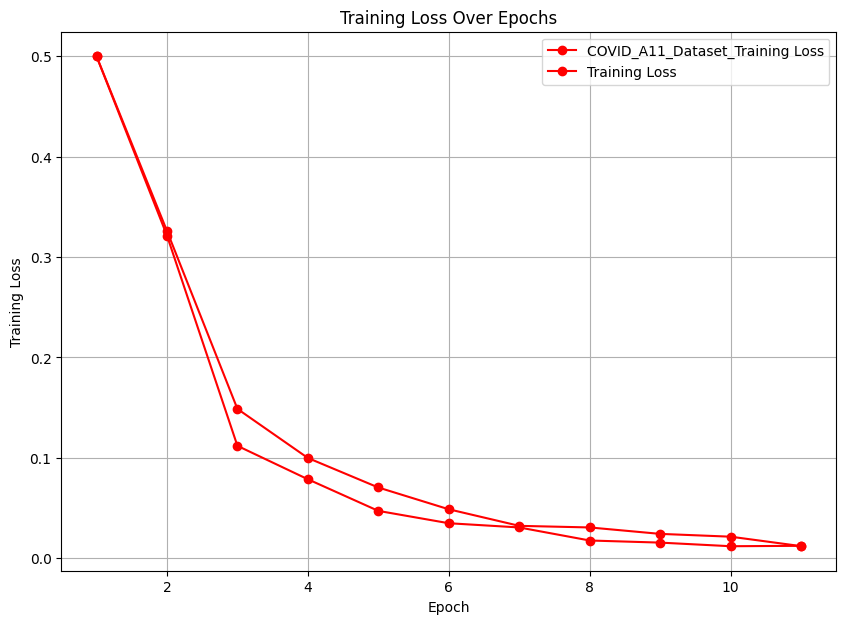

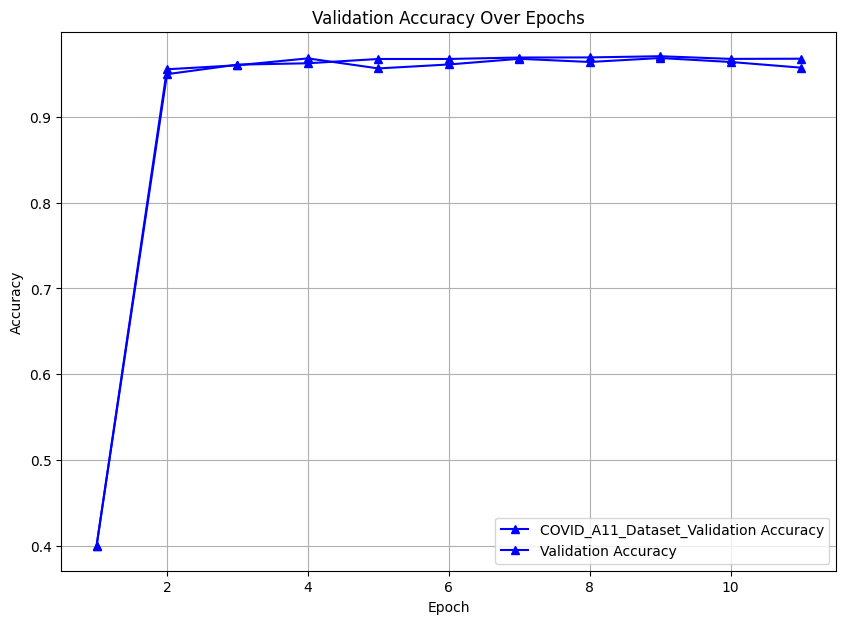

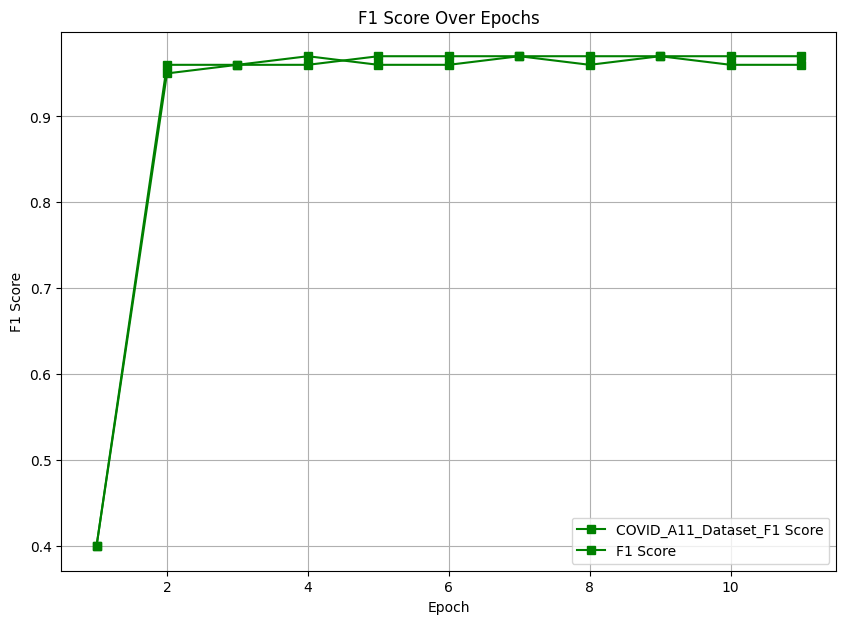

In [35]:
import matplotlib.pyplot as plt

# Plotting training loss
plt.figure(figsize=(10, 7))
plt.plot(epochs, training_loss, marker='o', linestyle='-', color='r', label='COVID_A11_Dataset_Training Loss')
plt.plot(epochs1, training_loss1, marker='o', linestyle='-', color='r', label='Training Loss')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Training Loss')
plt.grid(True)
plt.legend()
plt.show()

# Plotting validation accuracy
plt.figure(figsize=(10, 7))
plt.plot(epochs, validation_accuracy, marker='^', linestyle='-', color='b', label='COVID_A11_Dataset_Validation Accuracy')
plt.plot(epochs1, validation_accuracy1, marker='^', linestyle='-', color='b', label='Validation Accuracy')
plt.title('Validation Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend()
plt.show()

# Plotting F1 score
plt.figure(figsize=(10, 7))
plt.plot(epochs, f1_scores, marker='s', linestyle='-', color='g', label='COVID_A11_Dataset_F1 Score')
plt.plot(epochs1, f1_scores1, marker='s', linestyle='-', color='g', label='F1 Score')
plt.title('F1 Score Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('F1 Score')
plt.grid(True)
plt.legend()
plt.show()


In [31]:
import torch
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the model load path in Google Drive
model_load_path = '/content/drive/My Drive/bart_model_weights_covid_kaggle_dataset.pth'

# Initialize the model architecture again
model = BART_Arch(bart)
model = model.to(device)

# Load the saved weights
model.load_state_dict(torch.load(model_load_path, map_location=device))
print(f"Model weights loaded from {model_load_path}")

# Now the model can be used for inference or further training according to the above requirement

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Model weights loaded from /content/drive/My Drive/bart_model_weights_covid_kaggle_dataset.pth


**LIME**
---



In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=c50a2f7492a27b6d0a285da5a0218e356834f0d74e6fa930c76cdd6728793d15
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
# for LIME import necessary packages
from lime import lime_text
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
from lime.lime_text import IndexedString,IndexedCharacters
from lime.lime_base import LimeBase
from sklearn.linear_model import Ridge, lars_path
from lime.lime_text import explanation
from functools import partial
import scipy as sp
from sklearn.utils import check_random_state
import numpy as np
import lime
import torch
import torch.nn.functional as F
from lime.lime_text import LimeTextExplainer
from transformers import AutoTokenizer, AutoModelForSequenceClassification

In [ ]:
class_names = ['Real','Fake']
explainer = LimeTextExplainer(class_names=class_names)

**BERT tokenizer function**

In [ ]:
import torch
import torch.nn.functional as F

def tokenize_bart(x):
    # Encode the inputs
    tokens = tokenizer.batch_encode_plus(
        list(x[:]),
        max_length=max_seq_len,
        padding='max_length',
        truncation=True,
        return_token_type_ids=False
    )
    input_ids = torch.tensor(tokens['input_ids'])
    attention_mask = torch.tensor(tokens['attention_mask'])
    return input_ids, attention_mask

def predict_probab_bart(x):
    input_ids, attention_mask = tokenize_bart(x)
    model.eval()  # Ensure the model is in evaluation mode
    with torch.no_grad():  # No need to compute gradients
        # Forward pass through the model
        outputs = model(input_ids.to(device), attention_mask.to(device))
        # Assuming your model's forward method returns logits directly after softmax
        # If not, apply softmax to convert logits to probabilities
        probs = F.softmax(outputs, dim=1).cpu().numpy()  # Applying softmax on the correct dimension
    return probs


In [ ]:
True_Positive ="In a community setting remember the 3 Ws Wash your hands Watch your distance stay 6 feet apart WearAMask These habits can help you protect yourself and others from spreading COVID19"
False_Positive ="A photo shows a 19yearold vaccine for canine coronavirus that could be used to prevent the new coronavirus causing COVID19"
False_Negative ="A first vaccine while a welcome tool in fighting COVID19 may turn out to be of limited use The lesson learned from AIDS is the value of building a scientific infrastructure beyond a vaccine"
True_Negative ="At this rate India is slated to overtake USA in testing"

In [ ]:
TP_exp = explainer.explain_instance(True_Positive, predict_probab_bart, labels=(1, ),distance_metric='cosine',num_features=10, num_samples=500)
TP_exp.show_in_notebook()

In [ ]:
FP_exp = explainer.explain_instance(False_Positive, predict_probab_bart, labels=(1, ),distance_metric='cosine',num_features=10, num_samples=500)
FP_exp.show_in_notebook()

In [ ]:
FN_exp = explainer.explain_instance(False_Negative, predict_probab_bart, labels=(1, ),distance_metric='cosine',num_features=10, num_samples=500)
FN_exp.show_in_notebook()

In [ ]:
TN_exp = explainer.explain_instance(True_Negative, predict_probab_bart, labels=(1, ),distance_metric='cosine',num_features=10, num_samples=500)
TN_exp.show_in_notebook()

In [ ]:
import torch.nn.functional as F
def predict_probab(x):
  input_ids,attention_mask=tokenize_bert(x)
  out= model(input_ids.to(device),attention_mask.to(device))
  outt1 = out.detach().cpu().numpy()
  tt = torch.from_numpy(outt1)
  probs = F.softmax(tt, dim=1).cpu().numpy()
  return probs

In [ ]:
TP_exp.as_list()

[('would', -0.18809789402864235),
 ('doctor', -0.15602584451158028),
 ('seen', -0.14408675381081987),
 ('australians', -0.1362557349641813),
 ('disease', -0.10805398320154133),
 ('communicable', -0.09176930565066395),
 ('free', -0.08422343589751288),
 ('local', 0.0764735374230549),
 ('control', -0.06166100827560887),
 ('call', -0.03556454451016315)]

In [ ]:
True_Negative ="covid virus transmitted areas hot humid climates"
TN_exp = explainer.explain_instance(True_Negative, predict_probab, labels=(1, ),distance_metric='cosine',num_features=10, num_samples=500)
TN_exp.show_in_notebook()

In [ ]:
TN_exp.as_list()

[('areas', 0.08831835521350792),
 ('climates', 0.052851822603970956),
 ('humid', 0.051021225613097625),
 ('virus', -0.02116015714219136),
 ('hot', 0.020407046177180206),
 ('covid', 0.011828842490988594),
 ('transmitted', 0.002254565936885579)]

In [ ]:
False_Positive ="fact prolonged use medical masks properly worn cause co intoxication oxygen deficiency"
FP_exp = explainer.explain_instance(False_Positive, predict_probab, labels=(1, ),distance_metric='cosine',num_features=10, num_samples=500)
FP_exp.show_in_notebook()

In [ ]:
FP_exp.as_list()

[('fact', -0.3828899161434759),
 ('worn', -0.14219164798585107),
 ('masks', -0.11924673900892216),
 ('medical', -0.11595321461885363),
 ('cause', -0.06329899086725416),
 ('prolonged', 0.061995244921976875),
 ('intoxication', 0.05017510871396669),
 ('properly', -0.04485748598715701),
 ('co', 0.03415610592061939),
 ('oxygen', -0.029499056769369446)]

In [ ]:
False_Negative ="exposure alter structure function hemoglobin causing coronavirus patients die oxygen dep"
FN_exp = explainer.explain_instance(False_Negative, predict_probab, labels=(1, ),distance_metric='cosine',num_features=10, num_samples=500)
FN_exp.show_in_notebook()

In [ ]:
FN_exp.as_list()

[('exposure', 0.17930118560056812),
 ('alter', -0.07690744387735131),
 ('coronavirus', -0.07411148137219753),
 ('die', -0.06889165385687973),
 ('dep', -0.05997605646276773),
 ('hemoglobin', 0.04704152948759503),
 ('function', 0.02732631569411801),
 ('causing', -0.01896160999381351),
 ('oxygen', 0.01558095243418362),
 ('patients', -0.013058148644483208)]

**SHAP**
---

In [ ]:
!pip install shap

In [ ]:
!pip install nlp

In [ ]:
import pandas as pd
import torch
import numpy as np
import spacy
from torch.utils.data import Dataset
import torch.nn.functional as F

# Load SHAP_Exp_cases.csv
dfdd = pd.read_csv("SHAP_Exp_cases.csv")

from nlp import Dataset
df3=pd.DataFrame({"label":[],"text":[]})
df3["label"]=dfdd.loc[:]["label"]
df3["text"]=dfdd.loc[:]["text"]
dataset = Dataset.from_pandas(df3)


# Tokenization function
def tokenize_data(text):
    tokens = tokenizer.batch_encode_plus(
        text.tolist(),
        max_length=max_seq_len,
        padding='max_length',
        truncation=True,
        return_tensors='pt',
        add_special_tokens=False  # Change to True to include special tokens
    )
    test_seq = tokens['input_ids']
    test_mask = tokens['attention_mask']
    return test_seq, test_mask

# Prediction function
def predict_probab(x):
    input_ids, attention_mask = tokenize_data(x)
    with torch.no_grad():
        preds = model(input_ids.to(device), attention_mask.to(device))
    probs = F.softmax(preds, dim=1)
    return probs[:, 1].cpu().numpy()


In [ ]:
import nlp
import numpy as np
import scipy as sp
import shap

# Create the SHAP explainer
explainer = shap.Explainer(predict_probab, tokenizer)

# Generate SHAP values
shap_values = explainer(dataset, fixed_context=1)

In [ ]:
def remove_g_symbol_from_data(shap_values):
    cleaned_data = []
    for arr in shap_values.data:
        cleaned_arr = [s.replace('Ġ',"") for s in arr]
        cleaned_data.append(cleaned_arr)
    shap_values.data = tuple(cleaned_data)

# Update shap_values with cleaned data
remove_g_symbol_from_data(shap_values)

# Print everything
print("Updated shap_values:")
print(shap_values)

Updated shap_values:
.values =
array([array([-0.02679642, -0.0267556 , -0.02814181, -0.03072789, -0.03068119,
              -0.02523523, -0.02802536, -0.02881284, -0.03049123, -0.029999  ,
              -0.02803923, -0.02798833, -0.02794774, -0.0262633 , -0.02703196,
              -0.03100673, -0.02679439, -0.02695573, -0.02701632, -0.02595615,
              -0.02410276, -0.02382559, -0.02384805, -0.02268726, -0.0232332 ,
              -0.02416409, -0.02393285, -0.02348422, -0.02352993, -0.02412589,
              -0.0246202 , -0.02645784, -0.02496718, -0.02671082, -0.02501384,
              -0.02375386, -0.02545021, -0.02305592])                         ,
       array([-0.00478166, -0.01396393, -0.03559723, -0.03557345, -0.03798942,
              -0.027382  ,  0.00112968, -0.01605154,  0.06135075, -0.08134944,
              -0.03367073, -0.05804587, -0.02831059,  0.07351149,  0.09030912,
               0.13594661,  0.00276742, -0.0052736 , -0.04510777,  0.03269989,
              -0.000

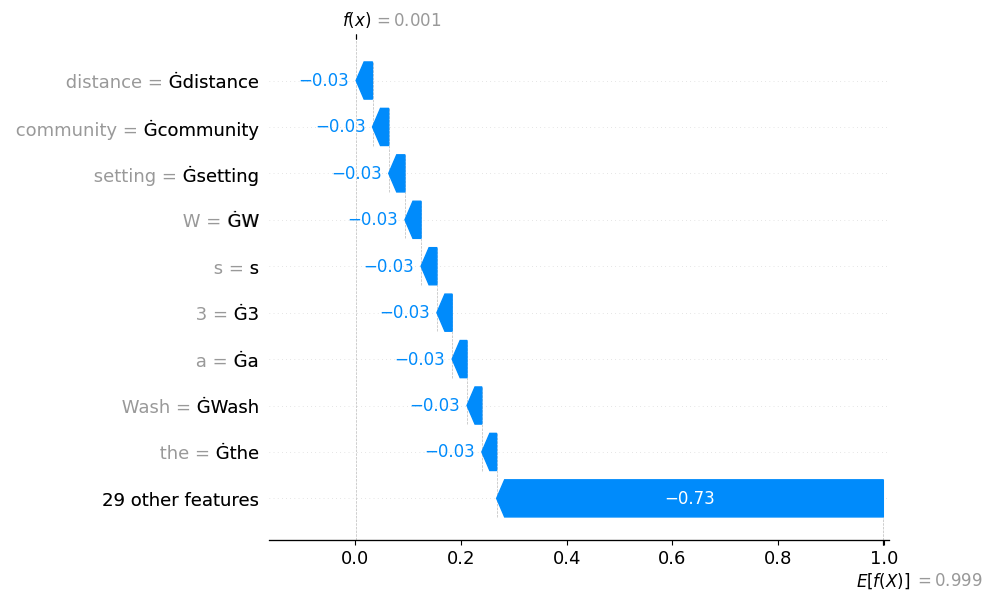

In [ ]:
shap.plots.waterfall(shap_values[0])

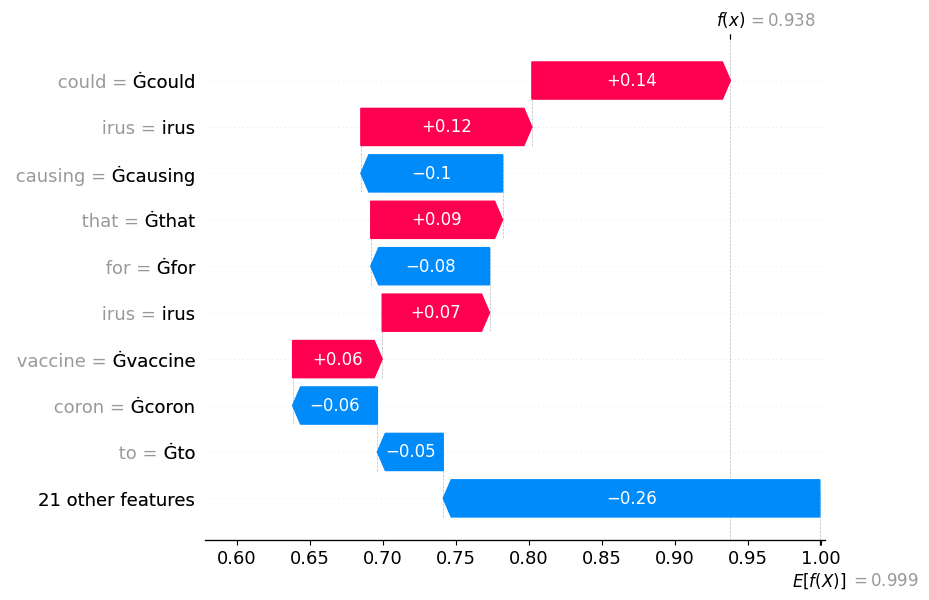

In [ ]:
shap.plots.waterfall(shap_values[1])

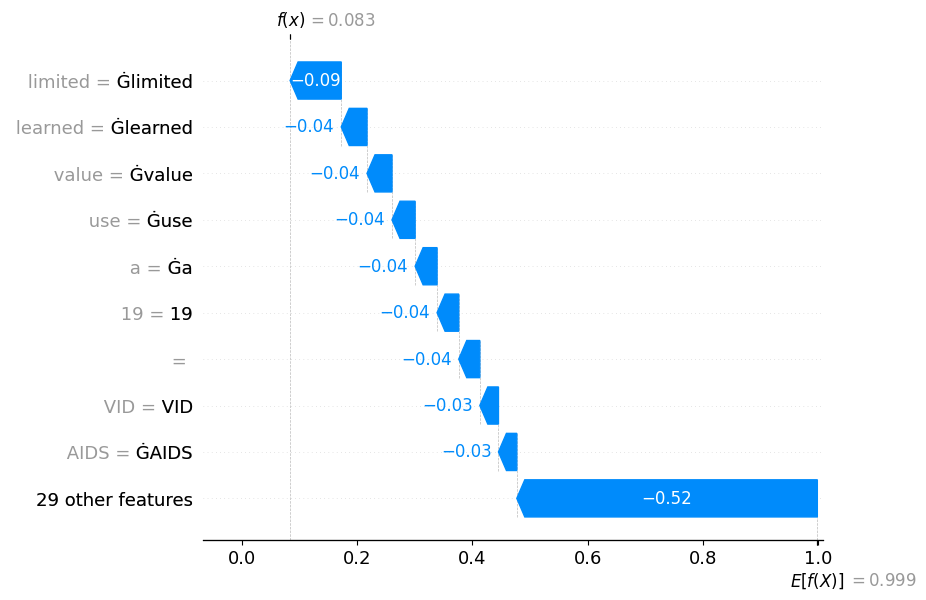

In [ ]:
shap.plots.waterfall(shap_values[2])

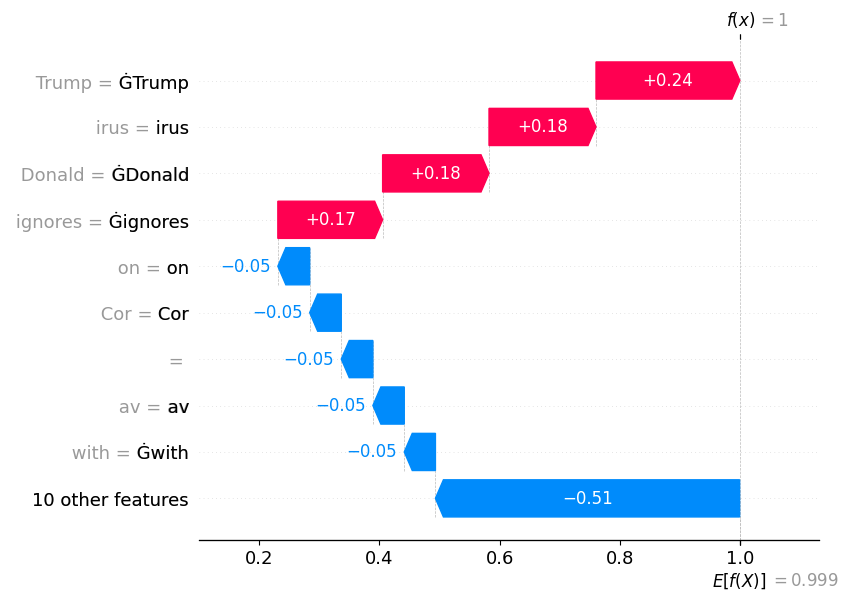

In [ ]:
shap.plots.waterfall(shap_values[10])

In [ ]:
shap.plots.text(shap_values[:1])

In [ ]:
shap.plots.text(shap_values[1:2])

In [ ]:
shap.plots.text(shap_values[2:3])

In [ ]:
shap.plots.text(shap_values[10:11])

**ELI5**
---

In [ ]:
import scipy as sp
import torch.nn.functional as F

In [ ]:
def tokenize_bart(x):
    # Encode the inputs
    tokens = tokenizer.batch_encode_plus(
        list(x[:]),
        max_length=max_seq_len,
        padding='max_length',
        truncation=True,
        return_token_type_ids=False
    )
    input_ids = torch.tensor(tokens['input_ids'])
    attention_mask = torch.tensor(tokens['attention_mask'])
    return input_ids, attention_mask

import torch.nn.functional as F
def predict_probab_eli5(x):
  input_ids,attention_mask=tokenize_bart(x)
  out= model(input_ids.to(device),attention_mask.to(device))
  outt1 = out.detach().cpu().numpy()
  tt = torch.from_numpy(outt1)
  probs = F.softmax(tt, dim=1).cpu().numpy()
  return probs

In [ ]:
# Tokenization function
def tokenize_data(text):
    tokens = tokenizer.batch_encode_plus(list(text[:]),
        max_length=max_seq_len,
        padding='max_length',
        truncation=True,
        return_tensors='pt',
        add_special_tokens=False  # Change to True to include special tokens
    )
    test_seq = tokens['input_ids']
    test_mask = tokens['attention_mask']
    return test_seq, test_mask

In [ ]:
import torch.nn.functional as F
def predict_probab(x):
  input_ids,attention_mask=tokenize_data(x)
  out= model(input_ids.to(device),attention_mask.to(device))
  outt1 = out.detach().cpu().numpy()
  tt = torch.from_numpy(outt1)
  probs = F.softmax(tt, dim=1).cpu().numpy()
  return probs

In [ ]:
import eli5
from eli5.lime import TextExplainer

# Assuming `True_Positive` is defined somewhere in your code

# Define the prediction function
def predict_probab_eli5(x):
    input_ids, attention_mask = tokenize_bart(x)  # Tokenize the text data
    out = model(input_ids.to(device), attention_mask.to(device))
    probs = F.softmax(out, dim=1).detach().cpu().numpy()
    return probs

# Initialize the TextExplainer
te = TextExplainer(random_state=42, n_samples=200, expand_factor=10)

# Fit the TextExplainer
te.fit(True_Positive, predict_probab_eli5)

# Show the explanation
te.show_prediction(target_names=["Real", "Fake"])


In [ ]:
feature_names = [word for text in True_Positive.split() for word in text.split()]
len(feature_names)

31

In [ ]:
True_Positive ="In a community setting remember the 3 Ws Wash your hands Watch your distance stay 6 feet apart WearAMask These habits can help you protect yourself and others from spreading COVID19"
False_Positive ="A photo shows a 19yearold vaccine for canine coronavirus that could be used to prevent the new coronavirus causing COVID19"
False_Negative ="A first vaccine while a welcome tool in fighting COVID19 may turn out to be of limited use The lesson learned from AIDS is the value of building a scientific infrastructure beyond a vaccine"
True_Negative ="At this rate India is slated to overtake USA in testing"

In [ ]:
import eli5
from eli5.lime import TextExplainer
te = TextExplainer(random_state=42,n_samples=200,expand_factor=10)
te.fit(True_Positive, predict_probab_eli5)
te.show_prediction(target_names=["Real","Fake"])

In [ ]:
import eli5
from eli5.lime import TextExplainer
te = TextExplainer(random_state=42,n_samples=200,expand_factor=10)
te.fit(True_Negative, predict_probab_eli5)
print(True_Negative)
te.show_prediction(target_names=["Real","Fake"])

At this rate India is slated to overtake USA in testing


In [ ]:
import eli5
from eli5.lime import TextExplainer
te = TextExplainer(random_state=42,n_samples=200,expand_factor=10)
te.fit(False_Positive, predict_probab_eli5)
print(False_Positive)
te.show_prediction(target_names=["Real","Fake"])

A photo shows a 19yearold vaccine for canine coronavirus that could be used to prevent the new coronavirus causing COVID19


In [ ]:
import eli5
from eli5.lime import TextExplainer

te = TextExplainer(random_state=42,n_samples=200,expand_factor=10)
te.fit(False_Negative, predict_probab_eli5)
print(False_Negative)
te.show_prediction(target_names=["Real","Fake"])

A first vaccine while a welcome tool in fighting COVID19 may turn out to be of limited use The lesson learned from AIDS is the value of building a scientific infrastructure beyond a vaccine
